We are interested in the swarm passes over our event. To do this we need to:

A: Plot the Images

B: Get the emphermis data for swarm B

C: Find the footprint of swarm B at the assumed emission height of 110km

D: Overplot the emphermis data with the ground based observations

Lets first grab our images from the package asilib

Lets choose a 3x2 grid to plot the images, our images will start at 14:04.20 and then move 10 seconds

In [1]:
import numpy as np #Lets handle our imports now for section A
import matplotlib.pyplot as plt
import asilib
import asilib.asi
from datetime import datetime, timedelta
from scipy.optimize import curve_fit
import scienceplots

plt.style.use(['science', 'no-latex'])


In [2]:
start_time= datetime(2022,12,19,14,4)
time_array= [start_time + timedelta(seconds=15*x) for x in range(9)]
alt=150

Transition Region Explorer (TREx) RGB data is courtesy of Space Environment Canada (space-environment.ca). Use of the data must adhere to the rules of the road for that dataset.  Please see below for the required data acknowledgement. Any questions about the TREx instrumentation or data should be directed to the University of Calgary, Emma Spanswick (elspansw@ucalgary.ca) and/or Eric Donovan (edonovan@ucalgary.ca).

“The Transition Region Explorer RGB (TREx RGB) is a joint Canada Foundation for Innovation and Canadian Space Agency project developed by the University of Calgary. TREx-RGB is operated and maintained by Space Environment Canada with the support of the Canadian Space Agency (CSA) [23SUGOSEC].”


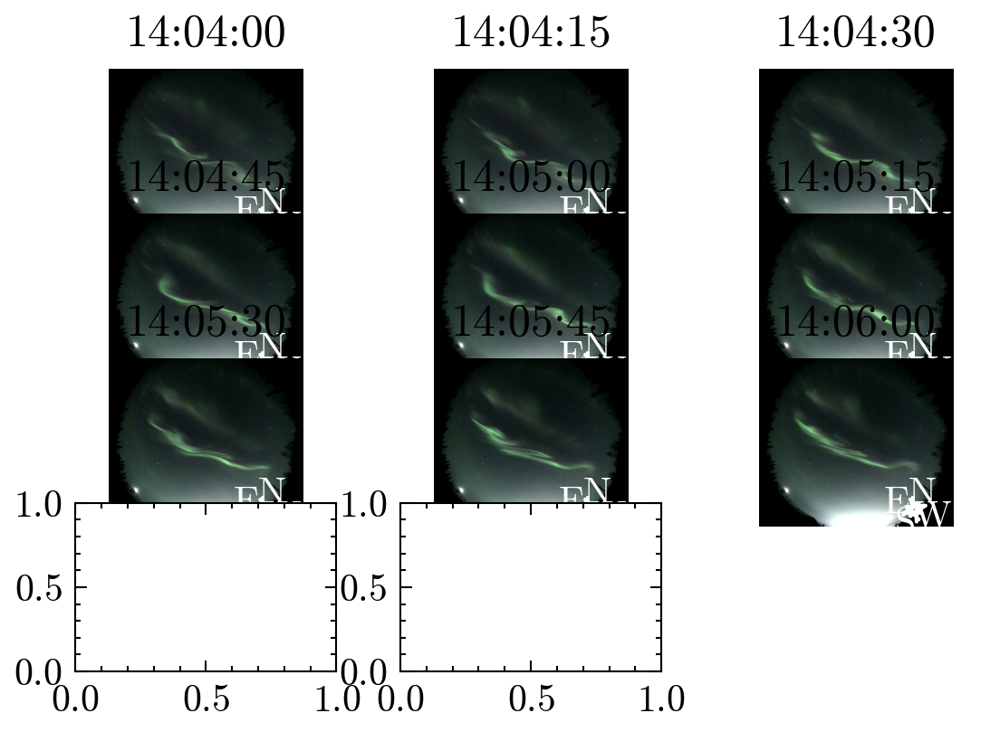

In [3]:
fig, axes = plt.subplots(nrows=4, ncols=3, dpi=300)
axlist=axes.flatten()
plt.axis('off')

for i in range(len(time_array)):
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array[i])

    asi.plot_fisheye(ax=axlist[i], label=False, cardinal_directions='NEWS')
    axlist[i].set_axis_off()
    axlist[i].set_title(time_array[i].strftime('%H:%M:%S%f')[:-6])
plt.tight_layout(pad=0.1, w_pad=0.6, h_pad=-2.5)
plt.savefig("test.png",bbox_inches='tight')

Now lets move onto part B

We are going to use the viresclient ESA client to download swarm empharmsis data with a frequency that matches the cadence of 3 so that it matches with the cadence of trex rgb.

In [4]:
from viresclient import set_token
from viresclient import SwarmRequest
import geopack.geopack as gp



Load IGRF coefficients ...


In [5]:
#Now we need to set our token, for my case to protect my token I import from a file not in the github cloud, however you can just paste your code from viresclient, just don't share it publically!


In [6]:
#From documentation link
def requester(sc_collection, measurement, residual, sampling_step=None, **kwargs):
    try:
        request = SwarmRequest()
        request.set_collection(sc_collection)
        if residual == True:
            request.set_products(
                measurements=measurement,
                models=["CHAOS"],
                residuals=True,
                sampling_step=sampling_step,
            )
        else:
            request.set_products(
                measurements=measurement,
                models=["CHAOS"],
                sampling_step=sampling_step,
            )
        data = request.get_between(time_array[0], time_array[-1]+timedelta(seconds=15), **kwargs) #sets to get data between the first and last value in time array iniatialized earlier
        df = data.as_dataframe()
    except:
        df = []
    return df

In [7]:
ds = requester( 
    "SW_OPER_MAGB_LR_1B", #Mag B, low resolution, 1Hz B (Magnetic field)
    "B_NEC", #Magnetic field in NEC coordinates
    True, 
    asynchronous=False,
    show_progress=False,
    sampling_step="PT{}S".format(15)) #cadence of 10 to match our images, in practice this selects every 10th data point since the resolution is 1 sample a second (sps)



In [8]:
latitude, longitude, altitude = ds['Latitude'].to_numpy(), ds['Longitude'].to_numpy(),  (ds["Radius"].to_numpy()-6.371e6)/1e3 #km  # Gets Emphermis data
print(ds.index)

DatetimeIndex(['2022-12-19 14:04:00', '2022-12-19 14:04:15',
               '2022-12-19 14:04:30', '2022-12-19 14:04:45',
               '2022-12-19 14:05:00', '2022-12-19 14:05:15',
               '2022-12-19 14:05:30', '2022-12-19 14:05:45',
               '2022-12-19 14:06:00'],
              dtype='datetime64[ns]', name='Timestamp', freq=None)


Good now that we have empharsis we need to find the footprint. To do this, we use geopack and asilib. Alternatively if you have IRBEM installed you can use asilib.conjunction.footprint to do this automagically.

In [9]:
t1 = time_array[0]
t0 = datetime(1970,1,1)
ut = (t1-t0).total_seconds()
lat_sat=np.deg2rad(latitude)
lon_sat=np.deg2rad(longitude)
gp.recalc(ut)
print(altitude)
r, theta= gp.geodgeo(altitude,lat_sat,1) #TODO magically, r is 10km less than if you calculated r manually, is this real

x_gc,y_gc,z_gc = gp.sphcar((r)/6371,theta,lon_sat,1)  #spherical to cartesian
 

x_gsm, y_gsm, z_gsm = gp.geogsm(x_gc,y_gc,z_gc, 1) #cartesian to gsm

x_foot,y_foot,z_foot=np.zeros(len(x_gsm)), np.zeros(len(y_gsm)), np.zeros(len(z_gsm)) #initalize an array


[501.23874 501.34883 501.46233 501.57917 501.69928 501.8226  501.94905
 502.07856 502.21106]


In [10]:
for index in range(len(x_gsm)):
    x_foot_int, y_foot_int, z_foot_int, xx2, yy2,zz2 = gp.trace(x_gsm[index], y_gsm[index], z_gsm[index], dir=1,rlim=2, r0=(alt-10+6371)/6371, maxloop=300 ) #traces each set of lat,lon,alt outward
    def curve_fit_func():
        def cubic(t, a, b, c, d):
            return a*t**3 + b*t**2 + c*t + d
        r = np.linspace(1, 1.5, 100000)

        radius_data=np.sqrt(xx2**2+yy2**2+zz2**2)

        params_x, _ = curve_fit(cubic, radius_data, xx2) #Constructs fits on the traces inward since the spatial resolution produced by geopack is limited.
        params_y, _ = curve_fit(cubic, radius_data, yy2)
        params_z, _ = curve_fit(cubic, radius_data, zz2)

        def x(t):
            return cubic(t, *params_x)

        def y(t):
            return cubic(t, *params_y)

        def z(t):
            return cubic(t, *params_z)
        def radius(t):
            return np.sqrt(x(t)**2 + y(t)**2 + z(t)**2)

        index_closest=np.argmin(np.abs(radius(r)-(alt-10+6371)/6371))

        return x(r[index_closest]),y(r[index_closest]),z(r[index_closest])

    x_foot[index],y_foot[index],z_foot[index] = curve_fit_func()

x_done, y_done, z_done = gp.geogsm(x_foot, y_foot, z_foot, -1)

alt_sat_done, lat_sat_done,lon_sat_done = np.zeros(len(x_done)), np.zeros(len(x_done)), np.zeros(len(x_done))
for index in range(len(x_done)):
    
    r_done,theta_done,lon_sat_done[index]= gp.sphcar(x_done[index], y_done[index], z_done[index],-1)

    alt_sat_done[index], lat_sat_done[index]= gp.geodgeo(r_done*6371,theta_done,-1) #TODO check if this is right

print(alt_sat_done, 'altitude derived from fit')

if np.any(np.abs(alt_sat_done - alt) > 5):
    raise Exception("One or more values in the footprinting are greater than 5km away from the specified alt. Contact owner for a fix, not your fault")
print(np.rad2deg(lon_sat_done)-360,np.rad2deg(lat_sat_done) , 'lat and lon' )
sat_lla=np.array([np.rad2deg(lat_sat_done), np.rad2deg(lon_sat_done)-360, alt_sat_done]).T

conjunction_obj = asilib.Conjunction(asi, (np.array(time_array), sat_lla))

[150.63656245 150.39126967 150.10908408 149.85454941 149.56482904
 149.27285026 148.97979405 148.68699976 148.36426858] altitude derived from fit
[-117.84810665 -117.69827515 -117.56260603 -117.43968266 -117.32816429
 -117.22696409 -117.13510349 -117.05172021 -116.97602116] [65.86738049 64.94464118 64.0224371  63.10071721 62.17961015 61.25910061
 60.33921791 59.41999059 58.50150673] lat and lon


Now lets use asilib to synthsize the empharsis data with the images

In [11]:
sat_azel, sat_azel_pixels = conjunction_obj.map_azel()

In [12]:
plt.rcParams["axes.edgecolor"] = "0.15"
plt.rcParams["axes.linewidth"]  = 2

14:04:00 2022-12-19 14:04:00
14:04:15 2022-12-19 14:04:15
14:04:30 2022-12-19 14:04:30
14:04:45 2022-12-19 14:04:45
14:05:00 2022-12-19 14:05:00
14:05:15 2022-12-19 14:05:15
14:05:30 2022-12-19 14:05:30
14:05:45 2022-12-19 14:05:45
14:06:00 2022-12-19 14:06:00
[389. 358. 309. 235. 148.  82.  46.  27.  16.] [datetime.datetime(2022, 12, 19, 14, 4), datetime.datetime(2022, 12, 19, 14, 4, 15), datetime.datetime(2022, 12, 19, 14, 4, 30), datetime.datetime(2022, 12, 19, 14, 4, 45), datetime.datetime(2022, 12, 19, 14, 5), datetime.datetime(2022, 12, 19, 14, 5, 15), datetime.datetime(2022, 12, 19, 14, 5, 30), datetime.datetime(2022, 12, 19, 14, 5, 45), datetime.datetime(2022, 12, 19, 14, 6)]


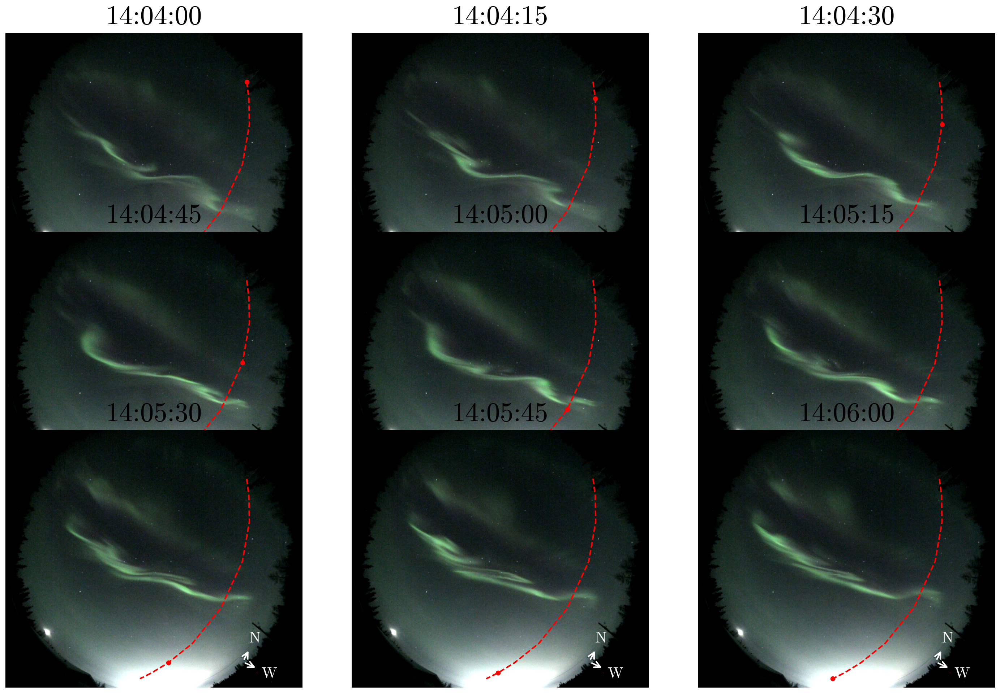

In [13]:
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=3, dpi=300)
axlist=axes.flatten()
plt.axis('off')
plt.tight_layout(pad=2, w_pad=1, h_pad=-14)
for i in range(len(time_array)):
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array[i])

    asi.plot_fisheye(ax=axlist[i], label=False, cardinal_directions='NW')
    axlist[i].set_axis_off()
    axlist[i].set_title(time_array[i].strftime('%H:%M:%S%f')[:-6], fontsize=18)
    print(time_array[i].strftime('%H:%M:%S%f')[:-6],  time_array[i])
print(sat_azel_pixels[:, 1], time_array)
for i in range(len(axlist)):
    axlist[i].plot(sat_azel_pixels[:, 0],
                            sat_azel_pixels[:, 1], color='red', linestyle="dashed")
    axlist[i].scatter(sat_azel_pixels[i, 0], sat_azel_pixels[i, 1],
                marker='o', s=5, color='red')

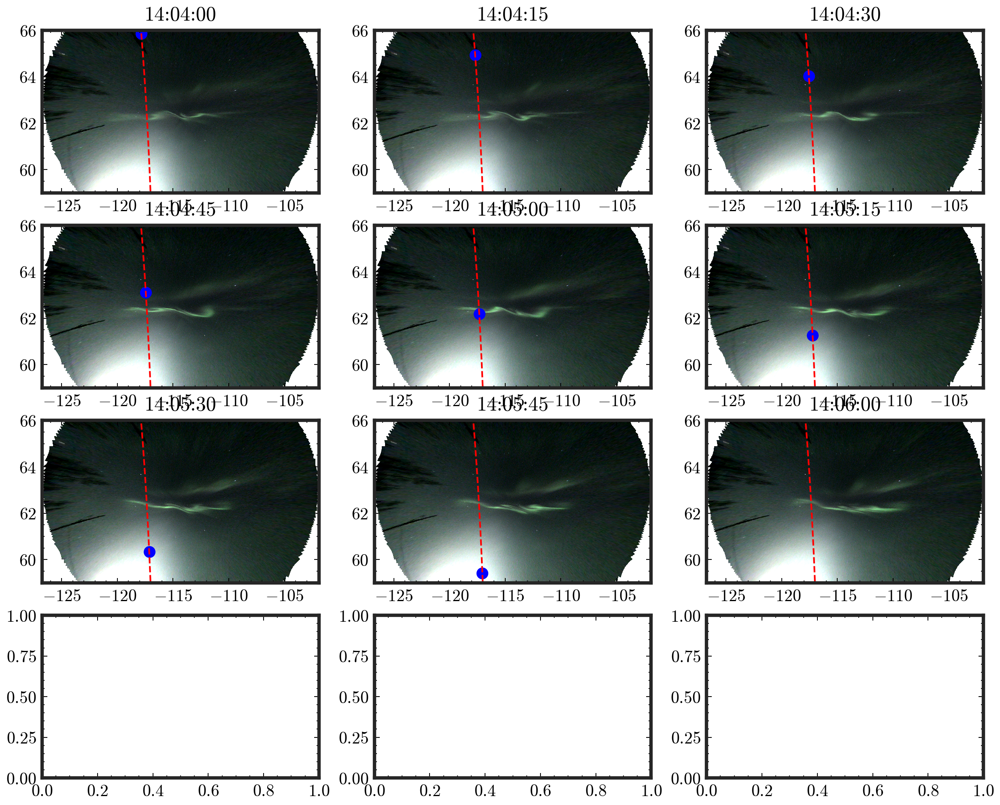

In [14]:
fig, axes = plt.subplots(figsize=(10,8), nrows=4, ncols=3, dpi=300)
axlist=axes.flatten()

for i in range(len(time_array)):
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array[i], colors='rgb')

    asi.plot_map(ax=axlist[i], asi_label=False)
    axlist[i].set_ylim(59, 66)
    axlist[i].set_title(time_array[i].strftime('%H:%M:%S%f')[:-6])
    axlist[i].plot(sat_lla[:,1], sat_lla[:,0], color='red', linestyle='dashed')
    axlist[i].scatter(sat_lla[i,1], sat_lla[i,0], color='blue')
plt.savefig("test.png",bbox_inches='tight')


Text(0.02, 0.5, 'Geographic Latitude')

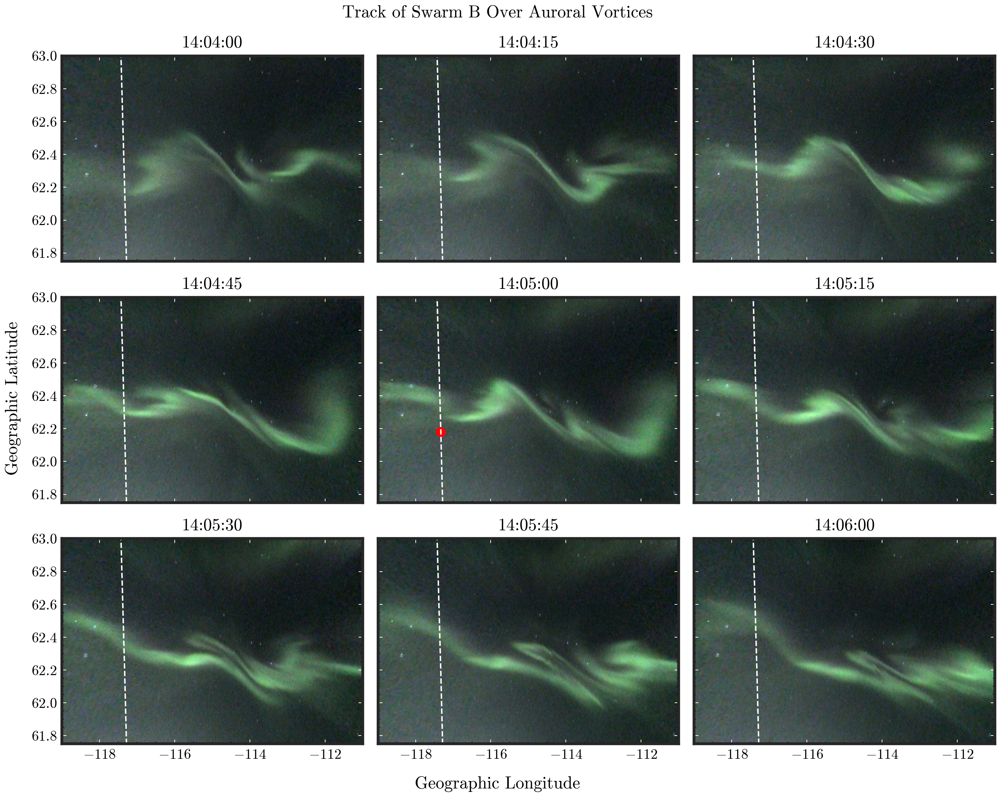

In [32]:
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=3, dpi=300, sharex=True, sharey=True, tight_layout=True)

axlist=axes.flatten()

for i in range(len(time_array)):
    axlist[i].tick_params(axis='both', colors='white', labelcolor='black')
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array[i], colors='rgb')

    asi.plot_map(ax=axlist[i], asi_label=False)
    axlist[i].set_title(time_array[i].strftime('%H:%M:%S%f')[:-6])
    axlist[i].set_xlim(-119,-111)
    axlist[i].set_ylim(61.75,63)
    axlist[i].plot(sat_lla[:,1], sat_lla[:,0], color='white', linestyle='dashed')
    axlist[i].scatter(sat_lla[i,1], sat_lla[i,0], color='red')
plt.savefig("test.png")
fig.suptitle("Track of Swarm B Over Auroral Vortices")
fig.supxlabel("Geographic Longitude", y=0.02)
fig.supylabel("Geographic Latitude")



[[  65.86738049 -117.84810665  150.63656245]
 [  64.94464118 -117.69827515  150.39126967]
 [  64.0224371  -117.56260603  150.10908408]
 [  63.10071721 -117.43968266  149.85454941]
 [  62.17961015 -117.32816429  149.56482904]
 [  61.25910061 -117.22696409  149.27285026]
 [  60.33921791 -117.13510349  148.97979405]
 [  59.41999059 -117.05172021  148.68699976]
 [  58.50150673 -116.97602116  148.36426858]]


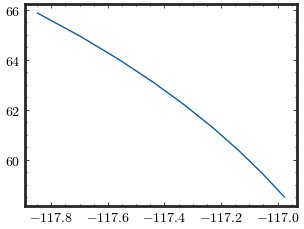

In [33]:
plt.plot(sat_lla[:,1], sat_lla[:,0])
print(sat_lla)